In [47]:
import pandas as pd

# importing libraries
import numpy as np
import seaborn as sns
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score
#from sklearn.metrics import confusion_matrix, f1_score, precision_score, recall_score

# for visualisation
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz
from IPython.display import Image  
from subprocess import call


In [48]:
# import dataset
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [49]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [50]:
# drop columns
titanic_df.drop(["Cabin", "Name", "Ticket", "PassengerId"], axis=1, inplace=True)

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [51]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [52]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"])
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Embarked,Sex_female,Sex_male
0,0,3,22.0,1,0,7.2500,S,False,True
1,1,1,38.0,1,0,71.2833,C,True,False
2,1,3,26.0,0,0,7.9250,S,True,False
3,1,1,35.0,1,0,53.1000,S,True,False
4,0,3,35.0,0,0,8.0500,S,False,True


Now, we do the same to the "Embarked" column.

In [53]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"])
titanic_df.head()

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,False,True,False,False,True
1,1,1,38.0,1,0,71.2833,True,False,True,False,False
2,1,3,26.0,0,0,7.9250,True,False,False,False,True
3,1,1,35.0,1,0,53.1000,True,False,False,False,True
4,0,3,35.0,0,0,8.0500,False,True,False,False,True


In [54]:
# Create dependent and independent variables
X = titanic_df.drop(["Survived"], axis=1)
y = titanic_df["Survived"]

# Create training and test sets
X_train_full, X_test, y_train_full, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [55]:
# Create training and development sets
X_train, X_dev, y_train, y_dev = train_test_split(X_train_full, y_train_full, test_size=0.2, random_state=42)

In [56]:
# Create decision tree without pruning
unpruned = DecisionTreeClassifier(max_depth=None, random_state=42)
unpruned.fit(X_train, y_train)
print("Performance without pruning: ", unpruned.score(X_test, y_test))
print("At depth: ", unpruned.tree_.max_depth)

Performance without pruning:  0.7653631284916201
At depth:  21


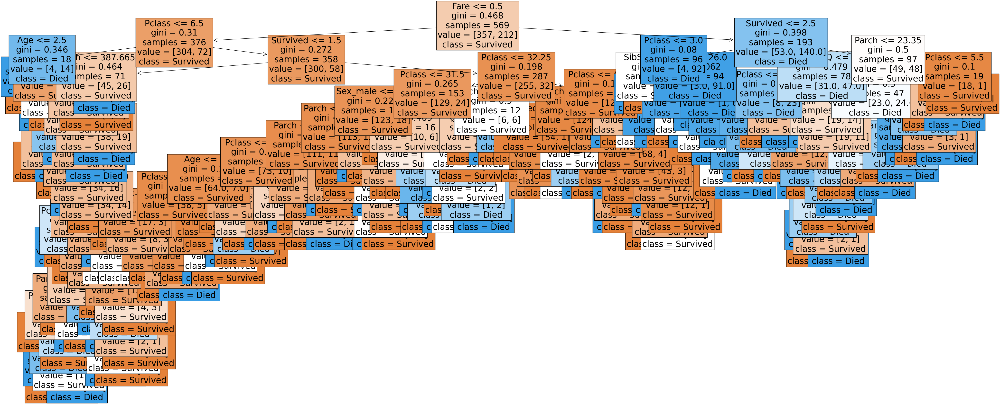

In [57]:
# Plot decision tree
plt.figure(figsize=(50,20))
features = titanic_df.columns
classes = ['Survived','Died']
tree.plot_tree(unpruned,feature_names=features,class_names=classes,filled=True,fontsize=25)
plt.show()

In [58]:
# Find training and testing accuracy
y_train_pred = unpruned.predict(X_train)
y_dev_pred = unpruned.predict(X_dev)

print(f'Training Accuracy: {accuracy_score(y_train, y_train_pred)}')
print(f'Development set Accuracy: {accuracy_score(y_dev, y_dev_pred)}')

Training Accuracy: 0.984182776801406
Development set Accuracy: 0.7622377622377622


In [59]:
# # Model with max depth 2
# pruned_2 = DecisionTreeClassifier(max_depth=2, random_state=42)
# pruned_2.fit(X_train, y_train)
# print("Performance with pruning: ", pruned_2.score(X_test, y_test))
# print("At depth: ", pruned_2.tree_.max_depth)

In [60]:
# plt.figure(figsize=(50,20))
# features = titanic_df.columns
# classes = ['Survived','Died']
# tree.plot_tree(pruned_2,feature_names=features,class_names=classes,filled=True,fontsize=25)
# plt.show()

In [61]:
# # looking at effect of max_depth pruning   
# pruned_depths = range(1,unpruned.tree_.max_depth+1)

# pruned_scores = [] 
# for d in pruned_depths:
#   clf = DecisionTreeClassifier(max_depth=d, random_state=42)
#   clf.fit(X_train, y_train)
#   score = clf.score(X_dev, y_dev)
#   pruned_scores.append(score)

# sns.lineplot(x=pruned_depths,y=pruned_scores, marker="o")
# plt.xlabel("Max_depth values")
# plt.ylabel("Accuracy")

In [62]:
# y_train_pred = pruned_2.predict(X_train)
# y_dev_pred = pruned_2.predict(X_dev)

# print(f'Training Accuracy: {accuracy_score(y_train, y_train_pred)}')
# print(f'Development set Accuracy: {accuracy_score(y_dev, y_dev_pred)}')

Performance with pruning:  0.7653631284916201
At depth:  2


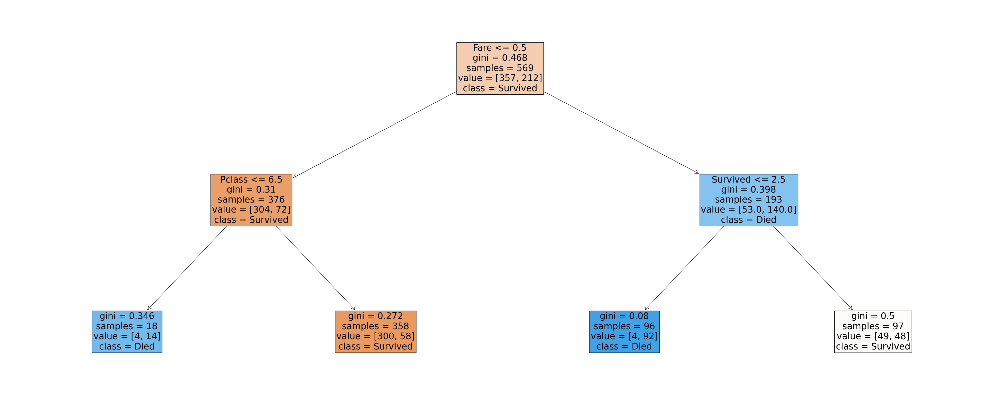

Performance with pruning:  0.7988826815642458
At depth:  3


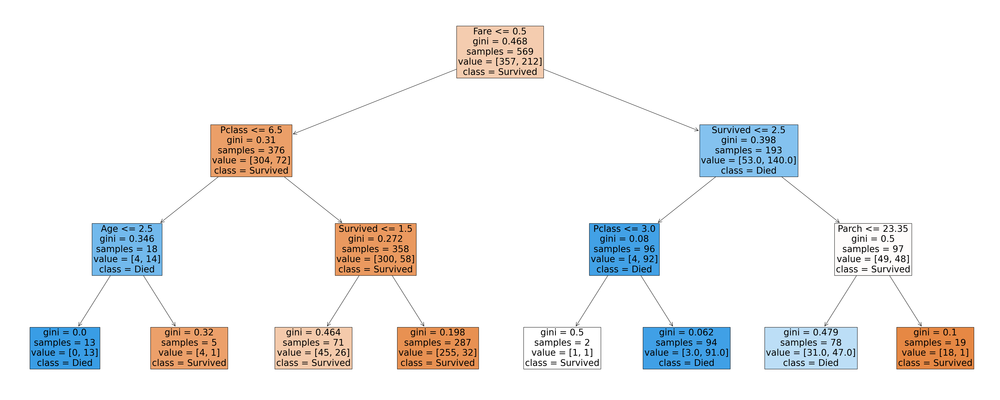

Performance with pruning:  0.7988826815642458
At depth:  4


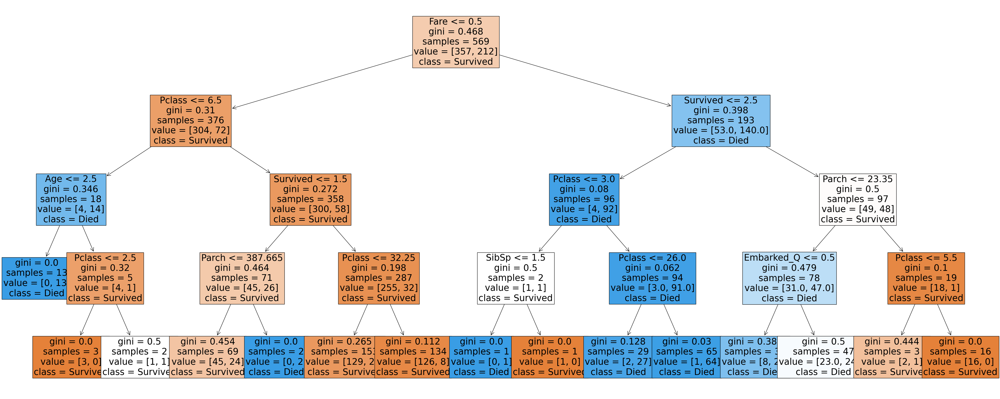

Performance with pruning:  0.8100558659217877
At depth:  5


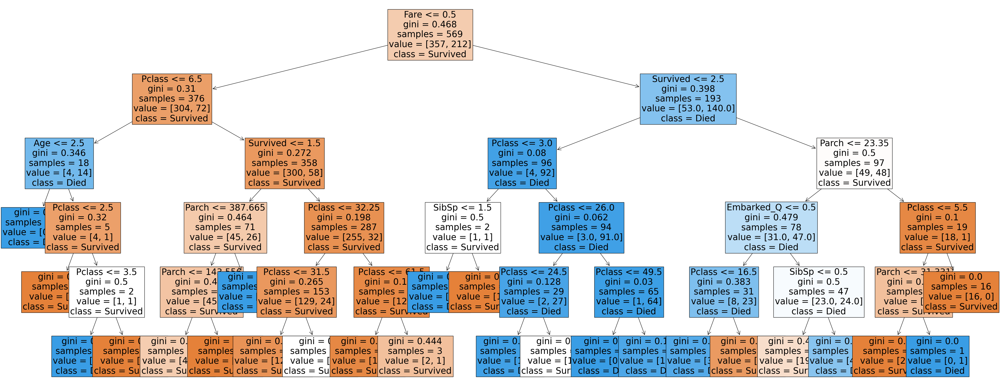

Performance with pruning:  0.7653631284916201
At depth:  6


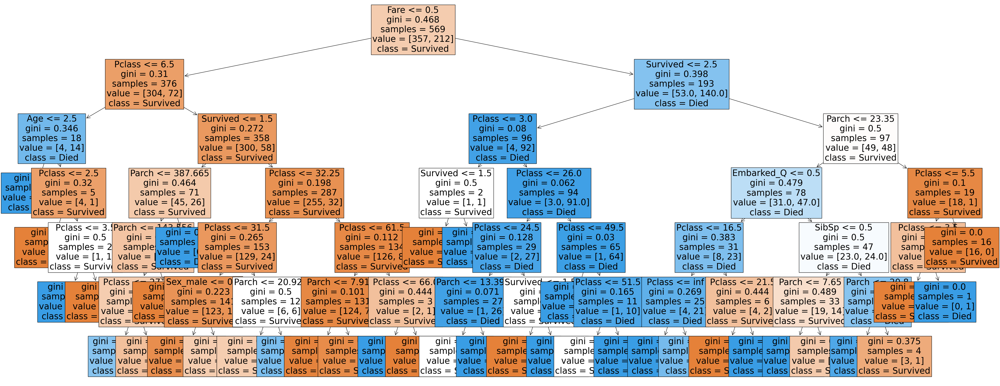

Performance with pruning:  0.7597765363128491
At depth:  7


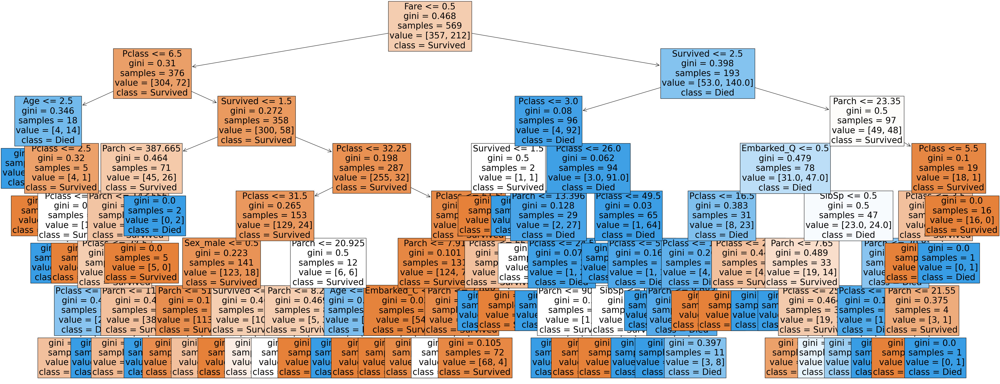

Performance with pruning:  0.7541899441340782
At depth:  8


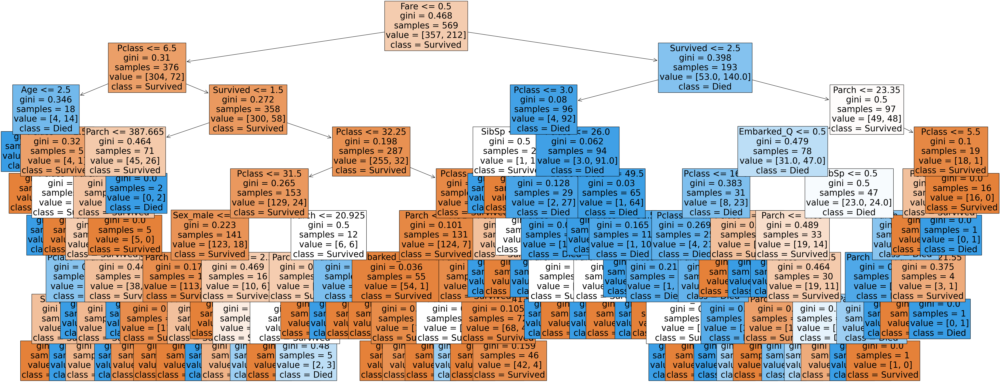

Performance with pruning:  0.7653631284916201
At depth:  9


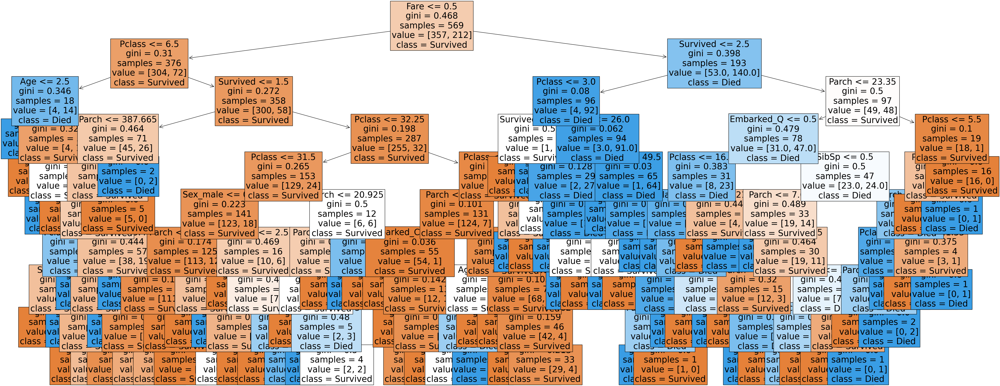

Performance with pruning:  0.7653631284916201
At depth:  10


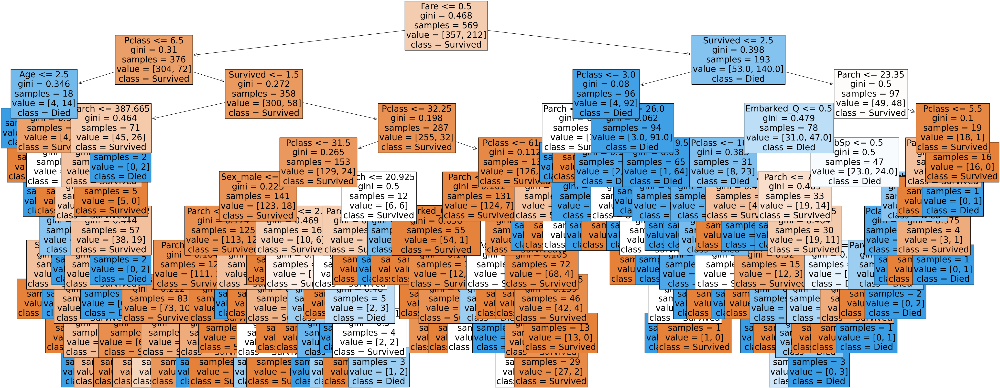

Training accuracy:  [0.7996485061511424, 0.8330404217926186, 0.8383128295254832, 0.8541300527240774, 0.8787346221441125, 0.8910369068541301, 0.9138840070298769, 0.9261862917398945, 0.9349736379613357]
Development accuracy:  [0.8181818181818182, 0.8321678321678322, 0.8321678321678322, 0.8181818181818182, 0.8041958041958042, 0.8111888111888111, 0.8111888111888111, 0.8181818181818182, 0.7902097902097902]


In [63]:
# Build model with different values of max depth and store accuracies at each stage
train_accuracy = []
dev_accuracy = []

for i in range (2,11):
    pruned_i = DecisionTreeClassifier(max_depth=i, random_state=42)
    pruned_i.fit(X_train, y_train)
    print("Performance with pruning: ", pruned_i.score(X_test, y_test))
    print("At depth: ", pruned_i.tree_.max_depth)

    plt.figure(figsize=(50,20))
    features = titanic_df.columns
    classes = ['Survived','Died']
    tree.plot_tree(pruned_i,feature_names=features,class_names=classes,filled=True,fontsize=25)
    plt.show()

    y_train_pred = pruned_i.predict(X_train)
    y_dev_pred = pruned_i.predict(X_dev)

    train_accuracy.append(accuracy_score(y_train, y_train_pred))
    dev_accuracy.append(accuracy_score(y_dev, y_dev_pred))
    
print("Training accuracy: ", train_accuracy)
print("Development accuracy: ", dev_accuracy)

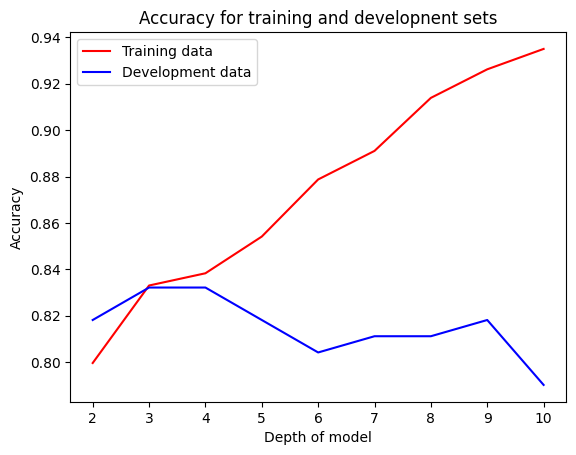

In [64]:
# Plot training and development accuracy 
y_values1 = train_accuracy
y_values2 = dev_accuracy
x_values1 = list(range(2, 2 + len(y_values1)))
x_values2 = list(range(2, 2 + len(y_values2)))

plt.plot(x_values1, y_values1, color = "r", label="Training data")
plt.plot(x_values2,y_values2, color="b", label="Development data")
plt.xlabel("Depth of model")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy for training and developnent sets")
plt.show()

We can see that the accuracy of our development data peaks when the depth of the model is 3. Our training data accuracy increases as the depth of model increases.

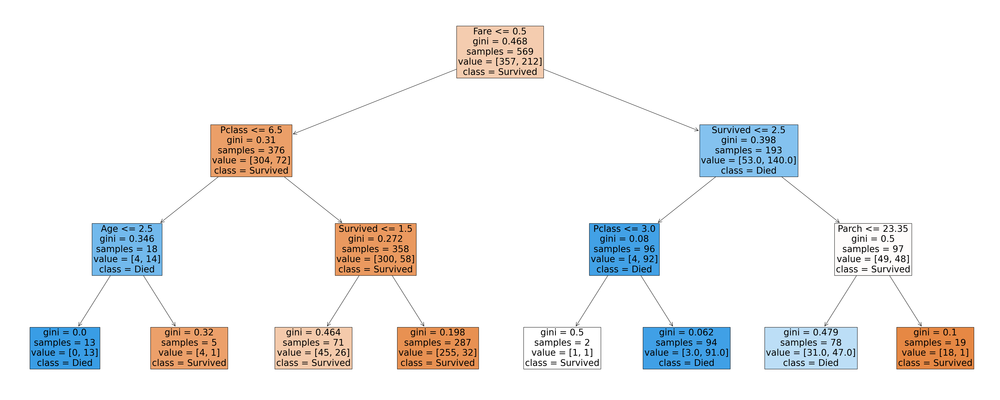

Training accuracy:  0.8330404217926186
Testing accuracy:  0.7988826815642458


In [65]:
# Create final model on test data
pruned = DecisionTreeClassifier(max_depth=3, random_state=42)
pruned.fit(X_train, y_train)

plt.figure(figsize=(50,20))
features = titanic_df.columns
classes = ['Survived','Died']
tree.plot_tree(pruned,feature_names=features,class_names=classes,filled=True,fontsize=25)
plt.show()

y_train_pred = pruned.predict(X_train)
y_test_pred = pruned.predict(X_test)

train_accuracy = (accuracy_score(y_train, y_train_pred))
test_accuracy = (accuracy_score(y_test, y_test_pred))
    
print("Training accuracy: ", train_accuracy)
print("Testing accuracy: ", test_accuracy)

The final accuracy of the model on the test data is 79.9%